In [1]:
from os.path import dirname, join as pjoin
import scipy.io as sio
from scipy.linalg import solve
from scipy.spatial import Delaunay
from scipy import interpolate
import plotly.figure_factory as ff
import numpy as np
import numpy.matlib
import matplotlib.pyplot as plt

# Translated libs
from meshlib import *
from rwglib import *
from pwslib import *

# Creating mesh

View RWG_IFA for more detailed simulation of this IFA antenna. In this work I will try to check PWS

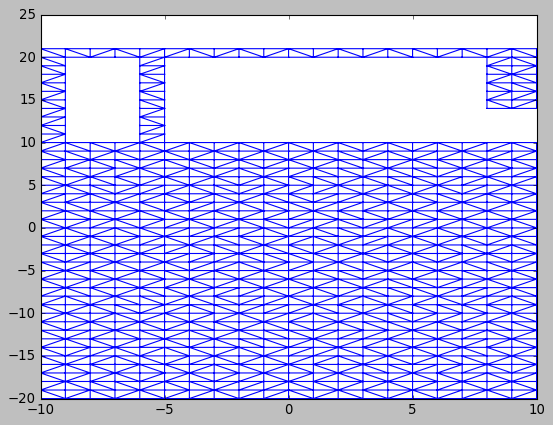

In [2]:
hull_bound_points = np.array([[10,-20],[-10,-20],[10,0],[-10,0]])
mesh_resolution = 1
tri = creatHull(hull_bound_points,mesh_resolution)

hull_bound_points_ext = np.array([[10,10],[-10,10],[10,0],[-10,0]])
mesh_resolution_ext = 1
commonEdge = np.array([[10,0],[-10,0]])
tri_final = extentHull(tri,hull_bound_points_ext,mesh_resolution_ext,commonEdge)

hull_bound_points_ext = np.array([[-10,20],[-9,20],[-10,10],[-9,10]])
mesh_resolution_ext = 1
commonEdge = np.array([[-10,10],[-9,10]])
tri_final = extentHull(tri_final,hull_bound_points_ext,mesh_resolution_ext,commonEdge)

hull_bound_points_ext = np.array([[-6,10],[-5,10],[-6,20],[-5,20]])
mesh_resolution_ext = 1
commonEdge = np.array([[-6,10],[-5,10]])
tri_final = extentHull(tri_final,hull_bound_points_ext,mesh_resolution_ext,commonEdge)

hull_bound_points_ext = np.array([[-10,20],[10,20],[-10,21],[10,21]])
mesh_resolution_ext = 1
commonEdge1 = np.array([[-10,20],[-9,20]])
commonEdge2 = np.array([[-6,20],[-5,20]])
tri_final = closeLoopHull(tri_final,hull_bound_points_ext,mesh_resolution_ext,commonEdge1,commonEdge2)

hull_bound_points_ext = np.array([[8,14],[10,14],[8,20],[10,20]])
mesh_resolution_ext = 1
commonEdge = np.array([[8,20],[10,20]])
tri_final = extentHull(tri_final,hull_bound_points_ext,mesh_resolution_ext,commonEdge)

plt.triplot(tri_final.points[:,0], tri_final.points[:,1], tri_final.simplices)
plt.show()

Using function
$$to3D(tri2D,scaleX,scaleY,rotX,rotY,rotZ,dX,dY,dZ)$$

In [3]:
tri_final = to3D(tri_final,1/500,1/500,0,0,0,0,0,0)

## Save to "p" and "t"

In [4]:
p = tri_final.points.T
t = np.ones((4,tri_final.simplices.shape[0]))
t[0:3,:] = tri_final.simplices.T + 1
t = t.astype(int)

# RWG1 Geometry calculations - all Chapters

Creates the RWG edge element for every inner edge of the structure. The total number of elements is EdgesTotal.

Outputs the following arrays:

Edge first node number          

    Edge_(1,1:EdgesTotal)
   
Edge second node number  

    Edge_(2,1:EdgesTotal)
    
Plus triangle number  

    TrianglePlus(1:EdgesTotal)
   
Minus triangle number           

    TriangleMinus(1:EdgesTotal)
   
Edge length                     

    EdgeLength(1:EdgesTotal)
   
Edge element indicator          
    
    EdgeIndicator(1:EdgesTotal)

Also outputs areas and midpoints of separate triangles:

Triangle area                   

    Area(1:TrianglesTotal)
   
Triangle center                 

    Center(1:TrianglesTotal)      
   
This script may handle surfaces with T-junctions including monopoles over various metal surfaces and certain metal meshes


In [5]:
x_,y_,z_ = p
fig_scale = max(max(x_)-min(x_),max(y_)-min(y_),max(z_)-min(z_))
x_scale,y_scale,z_scale=(max(x_)-min(x_))/fig_scale,(max(y_)-min(y_))/fig_scale,(max(z_)-min(z_))/fig_scale
fig1 = ff.create_trisurf(x=x_, y=y_, z=z_,
                         simplices=(t[0:3,:].T-1),
                         color_func=[i for i in range(len(t.T))],
                         show_colorbar=False,
                         title="Antenna mesh", aspectratio=dict(x=x_scale, y=y_scale, z=1))
fig1.show()

In [6]:
ANT_mesh1 = RWGmesh(p,t)

Total number of triangles is  1304
Total number of edges is  1861


This block is only meaningful for T junctions. It leaves only two edge elements at a junction

# RWG2: Geometry calculations - all Chapters
Uses the mesh file from RWG1, mesh1.mat, as an input.

Creates the following parameters of the RWG edge elements: 

Position vector rho_c_plus from the free vertex of the "plus" triangle to its center

                                   RHO_Plus(1:3,1:EdgesTotal)
                                   
Position vector rho_c_minus from the center of the "minus" triangle to its free vertex 

                                   RHO_Minus(1:3,1:EdgesTotal)

In addition to these parameters creates the following arrays for nine subtriangles (barycentric subdivision):

Midpoints of nine subtriangles

                                   Center_(1:3,1:9,1:TrianglesTotal)  
                                   
Position vectors rho_c_plus from the free vertex of the "plus" triangle to nine subtriangle midpoints

                                   RHO__Plus(1:3,1:9,1:EdgesTotal)
                                   
Position vectors rho_c_minus from nine subtriangle midpoints to the free vertex of the "minus" triangle

                                   RHO__Minus(1:3,1:9,1:EdgesTotal)

See Rao, Wilton, Glisson, IEEE Trans. Antennas and Propagation, vol. AP-30, No 3, pp. 409-418, 1982.


In [7]:
ANT_mesh2 = RWGmesh2(ANT_mesh1,t,p)

# Surface current - Radiated/scattered field over a large sphere

Uses the mesh file from RWG2, mesh2.mat, and the file containing surface current coefficients, current.mat, from RWG4 as inputs.

Uses the structure sphere.mat/sphere1.mat to display radiation intensity distribution over the sphere surface. 

The sphere doesn't intersect the radiating object.

The following parameters need to be specified:
        
        Sphere radius (m)

## Calculate impedance matrix

Taking into account the antenna feeding position

In [8]:
FeedPoint=[[-0.011],[0.02],[0]]

In [9]:
f = 1200e6
epsilon_    = 8.854e-012
mu_         = 1.257e-006
c_=1/np.sqrt(epsilon_*mu_)
eta_=np.sqrt(mu_/epsilon_)

In [10]:
mat_fname_sphere = pjoin('mesh', 'sphere_dense.mat')
print(mat_fname_sphere)
mat_contents_sphere = sio.loadmat(mat_fname_sphere)
p_sphere = mat_contents_sphere['p']
t_sphere = mat_contents_sphere['t']
p_sphere=100*p_sphere
K=1j*(2*np.pi*f/c_)

mesh\sphere_dense.mat


In [11]:
NumPoints = 100
R = 1000 # meter - distance to the antenna

In [12]:
Z, I, Impedance, FeedPower = calculateImpedance(f,c_,mu_,epsilon_,
                                                           p,ANT_mesh1,ANT_mesh2,FeedPoint)
SCurrent = currentDistribution(t,ANT_mesh1,ANT_mesh2,I)
Jmax = max(SCurrent)
CurrentNorm = SCurrent/max(SCurrent)
fig2 = ff.create_trisurf(x=x_, y=y_, z=z_,
                         simplices=(t[0:3,:].T-1),
                         color_func=list(CurrentNorm),
                         show_colorbar=True,
                         title="Antenna mesh - Normalized current distribution", aspectratio=dict(x=x_scale, y=y_scale, z=1))
fig2.show()

Current vector's size (1304,)


## 3D Radition pattern

In [13]:
ANT_moment = RWGmoment(ANT_mesh1,I)
U, TotalPower = radiating3DPower(t_sphere,p_sphere,ANT_moment,K,eta_)
print("Maximum E-field gain: ",10*np.log10(4*np.pi*max(U)/TotalPower),"dBi")
U_norm = 10*np.log10(4*np.pi*U/TotalPower)

Maximum E-field gain:  2.2015580356554754 dBi


In [14]:
U_points = radiating3DPower_updateSphere(t_sphere,p_sphere,ANT_moment,K,eta_)
U_points_dB = 10*np.log10(4*np.pi*U_points/TotalPower)
Th = max(U_points_dB) - 15 #dynamic range of 15dB
U_points_dB = np.array([max(U_points_dB[i]-Th,0.01) for i in range(p_sphere.shape[1])])
# If in dB
p_sphere_update = U_points_dB*p_sphere/1000
# If in linear scale
#p_sphere_update = U_points*p_sphere/1000

In [15]:
x_sphere,y_sphere,z_sphere = p_sphere_update
fig_scale_sphere = max(max(x_sphere)-min(x_sphere),max(y_sphere)-min(y_sphere),max(z_sphere)-min(z_sphere))
x_scale_sphere,y_scale_sphere,z_scale_sphere=(max(x_sphere)-min(x_sphere))/fig_scale_sphere,(max(y_sphere)-min(y_sphere))/fig_scale_sphere,(max(z_sphere)-min(z_sphere))/fig_scale_sphere
fig3 = ff.create_trisurf(x=x_sphere, y=y_sphere, z=z_sphere,
                         simplices=(t_sphere[0:3,:].T-1),
                         colormap="Rainbow",
                         plot_edges=True,
                         color_func=U_norm,
                         show_colorbar=True,
                         title="Radiation Pattern", 
                         aspectratio=dict(x=x_scale_sphere, y=y_scale_sphere, z=z_scale_sphere))
fig3.show()

# Calculate E-field and H-field

Calculate E-field at 20cm, propagate it at 50cm and compare the reconstructed field with the calculated (simulated) field.

### E-field @20mm

In [16]:
x_range = [-1,1]
y_range = x_range
distance = 0.02
Npoints = 201
x_ = np.linspace(x_range[0], x_range[1],Npoints)
y_ = np.linspace(y_range[0], y_range[1],Npoints)
x, y = np.meshgrid(x_, y_)
z = distance

#Field calculation 
E_field = np.zeros([Npoints, Npoints, 3],dtype = 'complex_')
H_field = np.zeros([Npoints, Npoints, 3],dtype = 'complex_')
for i in range(Npoints):
    for j in range(Npoints):
        ObservationPoint = np.array([x[i,j], y[i,j], z])
        U_field, W_efield, Poynting, E_field[i,j,:], H_field[i,j,:] = radiatingFields_atObservationPoint(ObservationPoint,ANT_moment,K,eta_)
E_field.shape

EField_20mm_org = field(E_field,x,y,z,Npoints,2*np.pi*f/c_,2*np.pi*f,epsilon_,1)
HField_20mm_org = field(H_field,x,y,z,Npoints,2*np.pi*f/c_,2*np.pi*f,epsilon_,1)

Originally, the E-field at 20mm

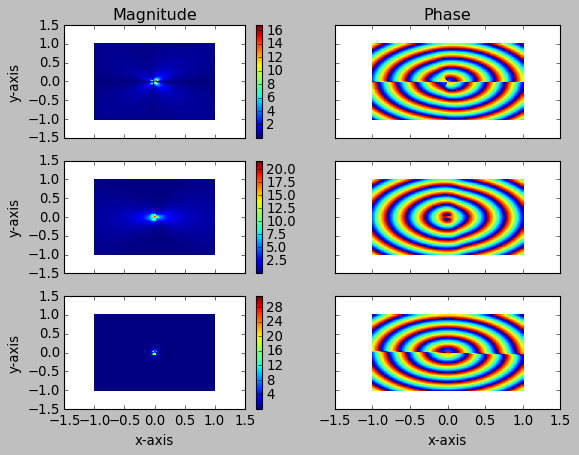

In [17]:
displayField(EField_20mm_org)

and the H-field at the same distace

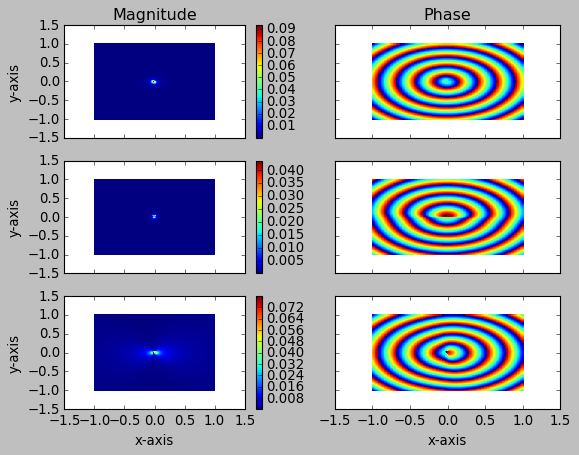

In [18]:
displayField(HField_20mm_org)

Imaging we have a dual-polarization probe system allows scanning the orthogonal components (X) and (Y) to the propagation direction of the E-field at 20mm. We need to reconstruct the full (3 components) E-field and H-field at 50mm. 

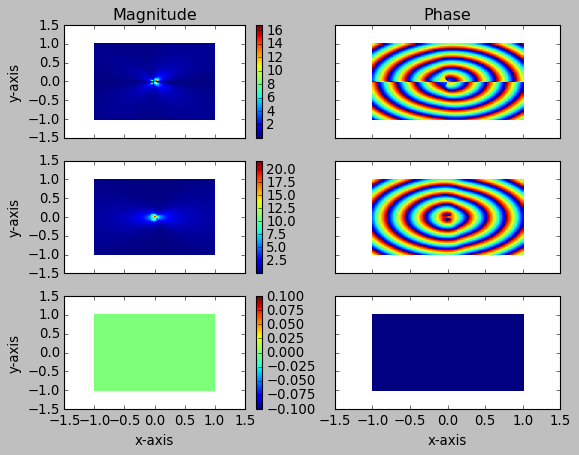

In [19]:
EField_20mm = deepcopy(EField_20mm_org)
EField_20mm.DZ = np.zeros(EField_20mm.DX.shape,dtype = 'complex_')
EField_20mm.D[:,:,2] = 0
displayField(EField_20mm)

**First step**: Reconstruct the Z component of the E-field at 20mm by Gauss's law:

$$sE_x.k_x + sE_y.k_y + sE_z.k_z = 0$$

Let's first prepare the spectral elements.

In [20]:
Nspec = Npoints
k0 = 2*np.pi*f/c_
dx = (x_range[1] - x_range[0])/(Npoints -1) #1.25e-3
dy = (y_range[1] - y_range[0])/(Npoints -1)
kx = 2*np.pi*np.fft.fftshift(np.fft.fftfreq(Npoints, d=dx))
ky = 2*np.pi*np.fft.fftshift(np.fft.fftfreq(Npoints, d=dy))
KX,KY = np.meshgrid(kx,ky)
KZ = np.conj(np.sqrt((k0**2-KX**2-KY**2)*(1+0j)))

Transform the spatial E-field to spectral one and reconstruct the missed component Z.

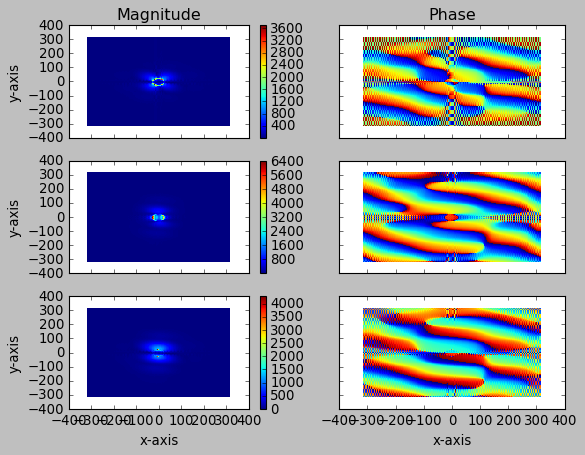

In [21]:
lambda_recz=np.abs(k0)*1e-4
sEField_20mm = deepcopy(EField_20mm)
sEField_20mm.X = KX
sEField_20mm.Y = KY
sEField_20mm.Z = KZ
sEField_20mm.DX = np.fft.fftshift(np.fft.fft2(np.fft.ifftshift(EField_20mm.DX)))
sEField_20mm.DY = np.fft.fftshift(np.fft.fft2(np.fft.ifftshift(EField_20mm.DY)))
sEField_20mm.DZ = -(sEField_20mm.DX*KX + sEField_20mm.DY*KY)*(np.conj(KZ)/(lambda_recz**2+np.abs(KZ)**2))
sEField_20mm.D = np.swapaxes(np.stack([sEField_20mm.DX, sEField_20mm.DY, sEField_20mm.DZ],axis=1),1,2)

displayField(sEField_20mm)

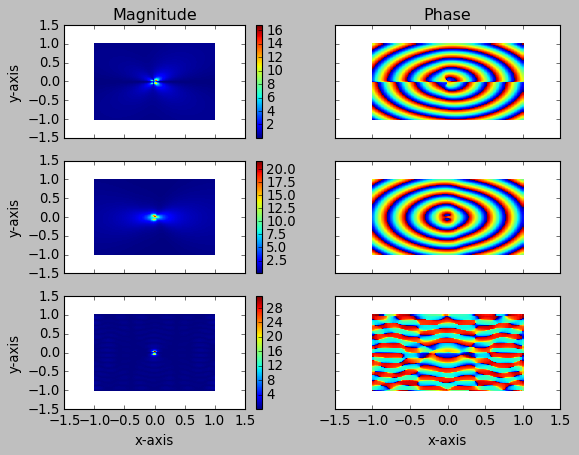

In [22]:
EField_20mm.DZ = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(sEField_20mm.DZ)))
displayField(EField_20mm)

**Second step**: Reconstruc the H-field at 20mm by Maxwell–Faraday equation:

$$\bigtriangledown\times sE = j\omega\mu_0 .sH$$

or more detailed:

$$(sE_z.k_y - sE_y.k_z).\overrightarrow{e_x} + (sE_x.k_z - sE_z.k_x).\overrightarrow{e_y} + (sE_y.k_x - sE_x.k_y).\overrightarrow{e_z} = j\omega\mu_0 (sH_x.\overrightarrow{e_x} + sH_y.\overrightarrow{e_y} + sH_z.\overrightarrow{e_z})$$

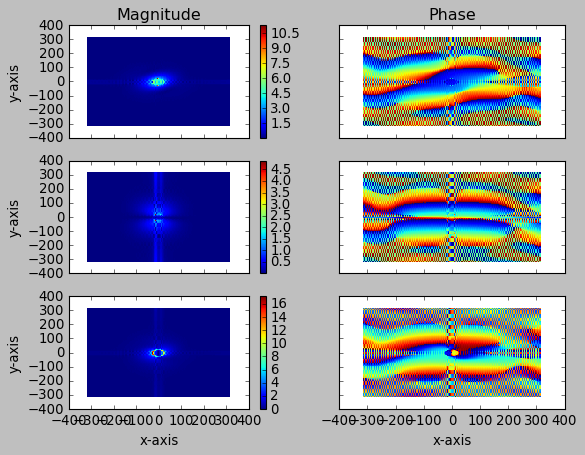

In [23]:
sHField_20mm = deepcopy(sEField_20mm)
sHField_20mm.X = KX
sHField_20mm.Y = KY
sHField_20mm.Z = KZ
sHField_20mm.DX = (sEField_20mm.DZ*KY - sEField_20mm.DY*KZ)/(1j*2*np.pi*f*mu_)
sHField_20mm.DY = (sEField_20mm.DX*KZ - sEField_20mm.DZ*KX)/(1j*2*np.pi*f*mu_)
sHField_20mm.DZ = (sEField_20mm.DY*KX - sEField_20mm.DX*KY)/(1j*2*np.pi*f*mu_)
sHField_20mm.D = np.swapaxes(np.stack([sHField_20mm.DX, sHField_20mm.DY, sHField_20mm.DZ],axis=1),1,2)

displayField(sHField_20mm)

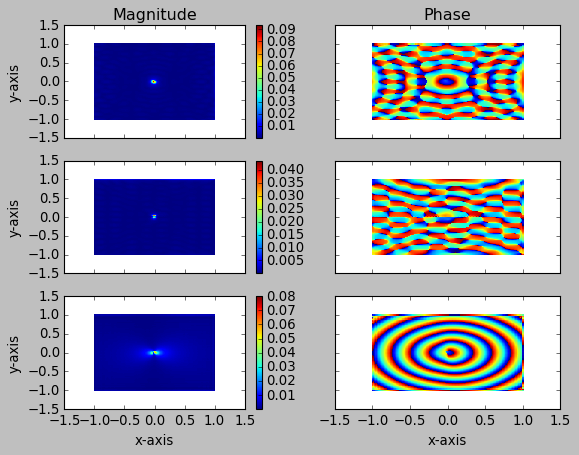

In [24]:
HField_20mm = deepcopy(EField_20mm)
HField_20mm.X = EField_20mm.X
HField_20mm.Y = EField_20mm.Y
HField_20mm.Z = EField_20mm.Z
HField_20mm.DX = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(sHField_20mm.DX)))
HField_20mm.DY = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(sHField_20mm.DY)))
HField_20mm.DZ = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(sHField_20mm.DZ)))
HField_20mm.D = np.swapaxes(np.stack([sHField_20mm.DX, sHField_20mm.DY, sHField_20mm.DZ],axis=1),1,2)

displayField(HField_20mm)

**Third step**: Propagate both E-field and H-field to 50mm by Plane Wave Expansion:

$$sE_{x/y/z-50mm} = sE_{x/y/z-20mm}.e^{-j(0.05-0.02)kz}$$

and

$$sH_{x/y/z-50mm} = sH_{x/y/z-20mm}.e^{-j(0.05-0.02)kz}$$

Let's first prepare the propagator $e^{-j(0.05-0.02)kz}$ in the equation:

In [25]:
propagator = np.fft.ifftshift(np.exp(-1j*(0.05-0.02)*KZ))

Then, propagate both fields.

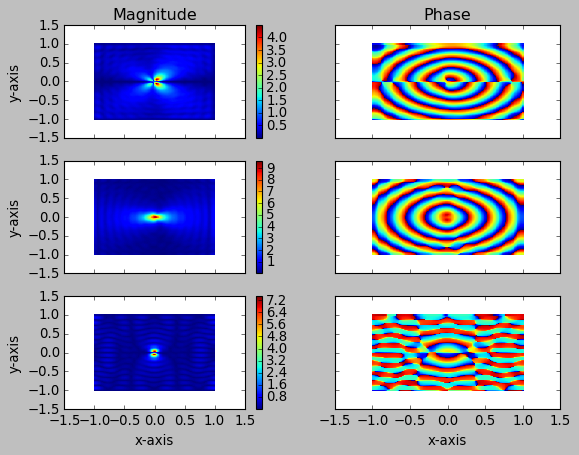

In [26]:
EField_50mm_rec = deepcopy(EField_20mm)
EField_50mm_rec.Z = 0.05
EField_50mm_rec.DX = np.fft.ifft2(np.multiply(propagator,np.fft.fft2(EField_20mm.DX)))
EField_50mm_rec.DY = np.fft.ifft2(np.multiply(propagator,np.fft.fft2(EField_20mm.DY)))
EField_50mm_rec.DZ = np.fft.ifft2(np.multiply(propagator,np.fft.fft2(EField_20mm.DZ)))
EField_50mm_rec.D = np.swapaxes(np.stack([EField_50mm_rec.DX, EField_50mm_rec.DY, EField_50mm_rec.DZ],axis=1),1,2)
displayField(EField_50mm_rec)

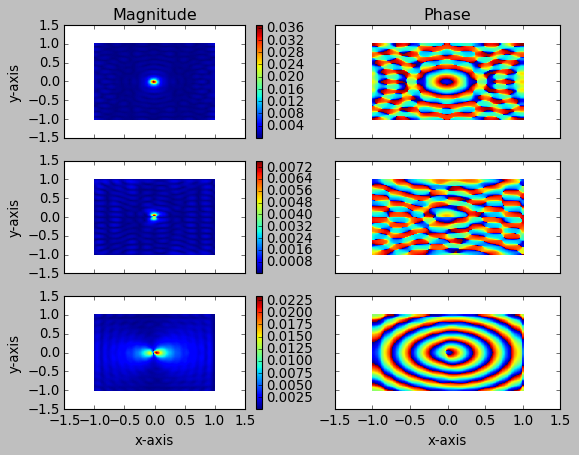

In [27]:
HField_50mm_rec = deepcopy(HField_20mm)
HField_50mm_rec.Z = 0.05
HField_50mm_rec.DX = np.fft.ifft2(np.multiply(propagator,np.fft.fft2(HField_20mm.DX)))
HField_50mm_rec.DY = np.fft.ifft2(np.multiply(propagator,np.fft.fft2(HField_20mm.DY)))
HField_50mm_rec.DZ = np.fft.ifft2(np.multiply(propagator,np.fft.fft2(HField_20mm.DZ)))
HField_50mm_rec.D = np.swapaxes(np.stack([HField_50mm_rec.DX, HField_50mm_rec.DY, HField_50mm_rec.DZ],axis=1),1,2)
displayField(HField_50mm_rec)

## E-field @50mm

In [28]:
distance = 0.05
z = distance

#Field calculation 
E_field = np.zeros([Npoints, Npoints, 3],dtype = 'complex_')
H_field = np.zeros([Npoints, Npoints, 3],dtype = 'complex_')
for i in range(Npoints):
    for j in range(Npoints):
        ObservationPoint = np.array([x[i,j], y[i,j], z])
        U_field, W_efield, Poynting, E_field[i,j,:], H_field[i,j,:] = radiatingFields_atObservationPoint(ObservationPoint,ANT_moment,K,eta_)
E_field.shape

EField_50mm_org = field(E_field,x,y,z,Npoints,2*np.pi*f/c_,2*np.pi*f,epsilon_,1)
HField_50mm_org = field(H_field,x,y,z,Npoints,2*np.pi*f/c_,2*np.pi*f,epsilon_,1)

Originally, the E-field at 50mm

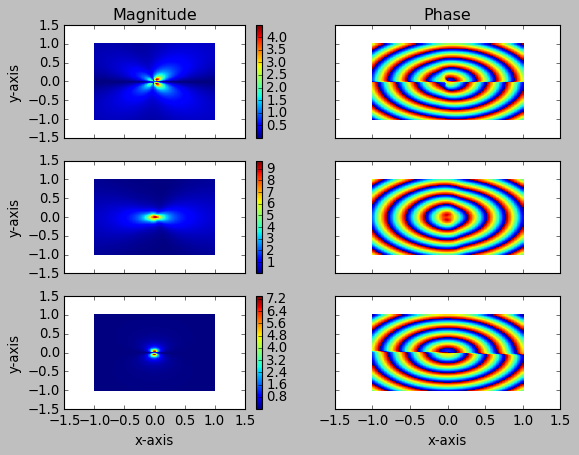

In [29]:
displayField(EField_50mm_org)

and the H-field at 50mm

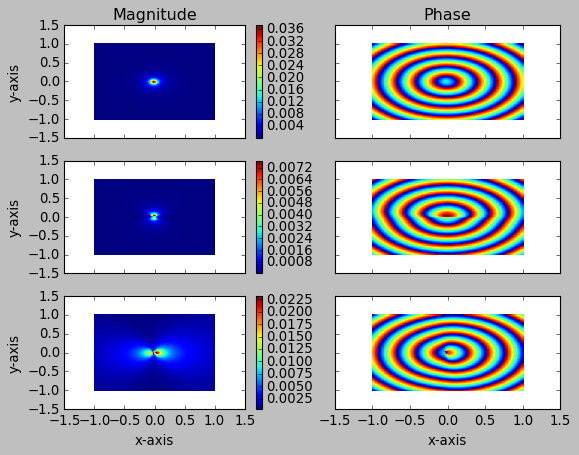

In [30]:
displayField(HField_50mm_org)

Both figures look alike ain't they!!! I will say that the PWS has successfully reconstruct the field in the direction of propagation!!

### Retro-propagation is still a bit problematic!

Except the level is not correct at the corner of the X-component, the E-field is retro-propagated quite correctly.

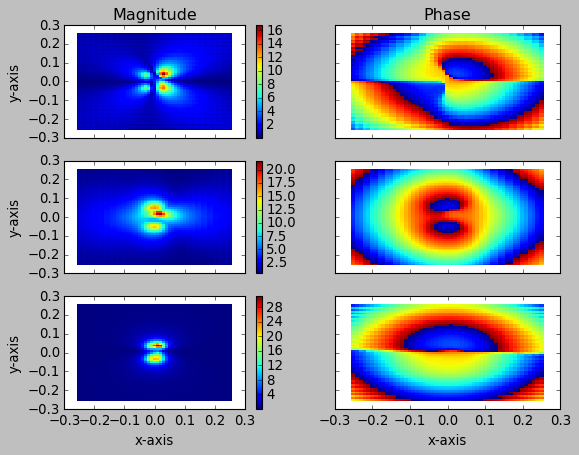

In [31]:
EField_20mm_rec = propagation(EField_50mm_org,0.02,EField_20mm.N,k0)
EField_20mm_rec.N = 50
EField_20mm_rec.X = EField_20mm_rec.X[75:126,75:126]
EField_20mm_rec.Y = EField_20mm_rec.Y[75:126,75:126]
EField_20mm_rec.Z = EField_20mm_rec.Z
EField_20mm_rec.DX = EField_20mm_rec.DX[75:126,75:126]
EField_20mm_rec.DY = EField_20mm_rec.DY[75:126,75:126]
EField_20mm_rec.DZ = EField_20mm_rec.DZ[75:126,75:126]
np.swapaxes(np.stack([EField_20mm_rec.DX, EField_20mm_rec.DY, EField_20mm_rec.DZ],axis=1),1,2)
displayField(EField_20mm_rec)